# CHG — Análisis Vectorial con Python
## Día 2 · Módulo B: Fiona, GeoPandas y estadísticas sobre raster

**Curso de Python para el Análisis Espacial**  
Confederación Hidrográfica del Guadalquivir

Datos: DERA — Datos Espaciales de Referencia de Andalucía (IECA)

---

## Contenidos

1. Fiona — I/O vectorial de bajo nivel
2. GeoPandas — análisis vectorial con GeoDataFrame
3. Análisis raster-vector: estadísticas zonales con `rasterstats`

In [75]:
DATA = 'data/'   # carpeta con los datos del curso

---
## 1. Fiona

Fiona es el wrapper Python de la capa **OGR** de GDAL.  
Su filosofía: un archivo vectorial es una colección de **features**, y cada feature es un diccionario GeoJSON.

```
feature = {
    'type':       'Feature',
    'geometry':   {'type': 'Polygon', 'coordinates': [[[x, y], ...]]},
    'properties': {'nombre': 'Iznájar', 'cuenca': 'Guadalquivir', ...}
}
```

**¿Cuándo usar Fiona directamente?**
- Control fino del schema de un archivo
- Procesar features una a una sin cargar todo en memoria
- Entender qué hace GeoPandas por debajo

In [76]:
import fiona
print(f'Fiona {fiona.__version__}')

# GeoPackage: un único archivo que puede contener varias capas
print('\nCapas en el GeoPackage de embalses:')
print(fiona.listlayers(DATA + 'embalses_guadalquivir.gpkg'))

Fiona 1.10.1

Capas en el GeoPackage de embalses:
['embalses_guadalquivir']


### 1.1 Abrir y explorar

In [77]:
with fiona.open(DATA + 'embalses_guadalquivir.gpkg') as src:
    print(f'Driver:      {src.driver}')
    print(f'CRS:         {src.crs}')
    print(f'EPSG:        {src.crs.to_epsg()}')
    print(f'Nº features: {len(src)}')
    print(f'Bounds:      {src.bounds}')
    print(f'\nSchema:')
    for k, v in src.schema.items():
        print(f'  {k}: {v}')

Driver:      GPKG
CRS:         EPSG:25830
EPSG:        25830
Nº features: 163
Bounds:      (189326.7463880072, 4085690.938849014, 533436.5987726928, 4258522.567324501)

Schema:
  properties: {'id_dera': 'float', 'codigo': 'float', 'nombre': 'str', 'cuenca': 'str', 'tipo': 'str', 'titular': 'str', 'estado': 'str'}
  geometry: Unknown


In [78]:
# Cada feature es un diccionario GeoJSON
with fiona.open(DATA + 'embalses_guadalquivir.gpkg') as src:
    feature = next(iter(src))

print('Claves:', list(feature.keys()))
print('\nPropiedades:')
for k, v in feature['properties'].items():
    print(f'  {k}: {v}')
print('\nTipo de geometría:', feature['geometry']['type'])

Claves: ['geometry', 'id', 'properties']

Propiedades:
  id_dera: 10301500000510.0
  codigo: 1069.0
  nombre: GUADALMELLATO (AZUD DERIVACION)
  cuenca: Guadalquivir
  tipo: Embalse de presa
  titular: Estado
  estado: Explotación

Tipo de geometría: Polygon


### 1.2 Iterar, filtrar y escribir

In [79]:
# Iterar sobre todos los embalses y calcular el área a partir de la geometría
from shapely.geometry import shape

with fiona.open(DATA + 'embalses_guadalquivir.gpkg') as src:
    embalses_lista = []
    for feature in src:
        geom    = shape(feature['geometry'])     # dict GeoJSON → objeto Shapely
        area_ha = geom.area / 10000
        embalses_lista.append({
            'nombre':  feature['properties']['nombre'],
            'titular': feature['properties']['titular'],
            'area_ha': round(area_ha, 1)
        })

# Los 10 embalses con mayor lámina de agua
top10 = sorted(embalses_lista, key=lambda x: x['area_ha'], reverse=True)[:10]
for e in top10:
    print(f"{e['nombre']:40s}  {e['area_ha']:8.1f} ha  ({e['titular']})")

GIRIBAILE                                   2369.4 ha  (Estado)
IZNAJAR                                     2335.1 ha  (Estado)
NEGRATIN                                    1982.9 ha  (Estado)
PUENTE NUEVO                                1805.8 ha  (Estado)
TRANCO DE BEAS                              1741.5 ha  (Estado)
GUADALEN                                    1408.8 ha  (Estado)
JANDULA                                     1362.7 ha  (Estado)
GUADALMENA                                  1329.9 ha  (Estado)
FERNANDINA, LA                              1091.3 ha  (Estado)
BEMBEZAR                                    1085.3 ha  (Estado)


In [80]:
# Filtrar y escribir: solo embalses de titularidad estatal
ruta_salida = '/tmp/embalses_estatales.gpkg'

with fiona.open(DATA + 'embalses_guadalquivir.gpkg') as src:
    schema = src.schema.copy()
    crs    = src.crs

    with fiona.open(ruta_salida, 'w', driver='GPKG', schema=schema, crs=crs) as dst:
        for feature in src:
            if feature['properties']['titular'] == 'Estado':
                dst.write(feature)

with fiona.open(ruta_salida) as f:
    print(f'Embalses estatales escritos: {len(f)}')

Embalses estatales escritos: 162


---
## 2. GeoPandas

GeoPandas extiende Pandas con una columna especial de geometrías (`geometry`).  
Un `GeoDataFrame` es un DataFrame donde cada fila tiene atributos alfanuméricos + una geometría Shapely.

In [81]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

print(f'GeoPandas {gpd.__version__}')

GeoPandas 1.1.3


### 2.1 Cargar los datos

In [82]:
embalses   = gpd.read_file(DATA + 'embalses_guadalquivir.gpkg')
cuencas    = gpd.read_file(DATA + 'cuencas_guadalquivir.gpkg')
aforos     = gpd.read_file(DATA + 'estaciones_aforo_guadalquivir.gpkg')
provincias = gpd.read_file(DATA + 'provincias_andalucia.gpkg')

print(f'Embalses:   {len(embalses):4d}  CRS: {embalses.crs.to_epsg()}')
print(f'Cuencas:    {len(cuencas):4d}  CRS: {cuencas.crs.to_epsg()}')
print(f'Aforos:     {len(aforos):4d}  CRS: {aforos.crs.to_epsg()}')
print(f'Provincias: {len(provincias):4d}  CRS: {provincias.crs.to_epsg()}')

Embalses:    163  CRS: 25830
Cuencas:     150  CRS: 25830
Aforos:      211  CRS: 25830
Provincias:    8  CRS: 25830


In [83]:
embalses.head()

,id_dera,codigo,nombre,cuenca,tipo,titular,estado,geometry
0,1.030150e+13,1069.0,GUADALMELLATO (AZUD DERIVACION),Guadalquivir,Embalse de presa,Estado,Explotación,"POLYGON ((353157.848 4211480.452, 353156.348 4..."
1,1.030150e+13,1649.0,PEDRO MARIN,Guadalquivir,Embalse de presa,Estado,Explotación,"POLYGON ((472490.01 4197547.825, 472489.51 419..."
2,1.030150e+13,1172.0,JANDULA,Guadalquivir,Embalse de presa,Estado,Explotación,"POLYGON ((419716.955 4244802.272, 419735.955 4..."
3,1.030150e+13,1418.0,MOLINO SANTA ANA,Guadalquivir,Embalse de presa,Estado,Explotación,"POLYGON ((311170.182 4151490.28, 311201.076 41..."
4,1.030150e+13,1860.0,RANCHO VELARDE 3,Guadalquivir,Embalse de presa,Estado,Explotación,"POLYGON ((287439.106 4166770.144, 287445.651 4..."


### 2.2 Atributos geométricos

In [84]:
embalses['area_ha']  = (embalses.geometry.area / 10000).round(1)
embalses['perim_km'] = (embalses.geometry.length / 1000).round(2)

print('Los 10 embalses con mayor lámina de agua:')
embalses.nlargest(10, 'area_ha')[['nombre', 'titular', 'area_ha', 'perim_km']]

Los 10 embalses con mayor lámina de agua:


,nombre,titular,area_ha,perim_km
145,GIRIBAILE,Estado,2369.4,92.02
154,IZNAJAR,Estado,2335.1,91.35
142,NEGRATIN,Estado,1982.9,118.12
139,PUENTE NUEVO,Estado,1805.8,86.75
144,TRANCO DE BEAS,Estado,1741.5,88.71
102,GUADALEN,Estado,1408.8,80.80
2,JANDULA,Estado,1362.7,96.99
56,GUADALMENA,Estado,1329.9,114.17
146,"FERNANDINA, LA",Estado,1091.3,88.88
109,BEMBEZAR,Estado,1085.3,140.83


In [85]:
print(f'Superficie total láminas de agua: {embalses.area_ha.sum():.0f} ha')
print(f'Embalse más grande: {embalses.loc[embalses.area_ha.idxmax(), "nombre"]} ({embalses.area_ha.max():.0f} ha)')
print(f'\nPor titularidad:')
print(embalses.groupby('titular')['area_ha']
      .agg(['count', 'sum'])
      .rename(columns={'count': 'n_embalses', 'sum': 'area_ha_total'})
      .round(0))

Superficie total láminas de agua: 34654 ha
Embalse más grande: GIRIBAILE (2369 ha)

Por titularidad:
                           n_embalses  area_ha_total
titular                                             
Administración Autonómica           1            7.0
Estado                            162        34647.0


### 2.3 Filtrado

In [86]:
# Filtrado atributual
grandes   = embalses[embalses['area_ha'] > 500]
estatales = embalses[embalses['titular'] == 'Estado']
print(f'Embalses > 500 ha:           {len(grandes)}')
print(f'Embalses titularidad Estado: {len(estatales)}')

# Filtrado espacial: embalses dentro de Jaén
jaen = provincias[provincias['provincia'] == 'Jaén']
embalses_jaen = gpd.clip(embalses, jaen)
print(f'Embalses en Jaén:            {len(embalses_jaen)}')

Embalses > 500 ha:           23
Embalses titularidad Estado: 162
Embalses en Jaén:            30


### 2.4 CRS y reproyección

In [87]:
print(f'CRS actual:    {embalses.crs}')
print(f'Es proyectado: {embalses.crs.is_projected}')
print(f'Unidades:      {embalses.crs.axis_info[0].unit_name}')

# Reproyectar a WGS84
embalses_geo = embalses.to_crs(epsg=4326)

# Centroide: calcular en CRS proyectada (25830) y luego reproyectar el punto
iznajr = (embalses[embalses['nombre'] == 'IZNAJAR']
          .geometry.centroid
          .to_crs(epsg=4326)
          .values[0])
print(f'\nCentroide Iznájar en WGS84: lon={iznajr.x:.5f}, lat={iznajr.y:.5f}')

CRS actual:    EPSG:25830
Es proyectado: True
Unidades:      metre

Centroide Iznájar en WGS84: lon=-4.31820, lat=37.26664


### 2.5 Dissolve — fusionar geometrías

In [88]:
# Fusionar todas las subcuencas en una sola cuenca
cuenca_total = cuencas.dissolve()
print(f'Área total cuenca Guadalquivir: {cuenca_total.geometry.area.values[0] / 1e9:.2f} millones ha')

# Fusionar embalses por titularidad (geometría unión + suma de área)
por_titular = embalses.dissolve(by='titular', aggfunc={'area_ha': 'sum'})
por_titular[['area_ha']]

Área total cuenca Guadalquivir: 51.49 millones ha


,area_ha
titular,
Administración Autonómica,6.8
Estado,34647.3


### 2.6 Spatial join — ¿en qué subcuenca está cada embalse?

`gpd.sjoin()` combina dos GeoDataFrames usando una relación espacial como predicado (en lugar de un campo común).  
El parámetro `how` controla qué filas aparecen en el resultado, igual que en SQL:

| `how`     | Filas que aparecen | NaNs en el resultado |
|-----------|--------------------|----------------------|
| `'left'`  | Todos los embalses, tengan subcuenca o no | Sí, en columnas de subcuenca si no hay coincidencia |
| `'inner'` | Solo embalses que caen dentro de alguna subcuenca | No |
| `'right'` | Todas las subcuencas, tengan embalses o no | Sí, en columnas de embalse si no hay embalse |

> `how='outer'` no está soportado en GeoPandas.

In [89]:
embalses_cuenca = gpd.sjoin(
    embalses[['nombre', 'titular', 'area_ha', 'geometry']],
    cuencas[['nombre_sub', 'cod_subcue', 'geometry']],
    how='left',
    predicate='within'
)

print('Muestra:')
print(embalses_cuenca[['nombre', 'area_ha', 'nombre_sub']].dropna().head(10).to_string(index=False))

Muestra:
                         nombre  area_ha                                nombre_sub
GUADALMELLATO (AZUD DERIVACION)     48.0                             GUADALMELLATO
                        JANDULA   1362.7                                   JANDULA
               MOLINO SANTA ANA      0.8                                BAJO GENIL
               RANCHO VELARDE 3      4.1        GUADALQUIVIR DEL GENIL AL CORBONES
                      QUEMAS II      7.0         GUADIAMAR Y MARISMAS HASTA EL MAR
               RANCHO VELARDE 1      5.6        GUADALQUIVIR DEL GENIL AL CORBONES
         POZO NUEVO Y SAN LISTA      3.6        GUADALQUIVIR DEL GENIL AL CORBONES
              PROVINCIALES, LOS      6.2                                      VIAR
                   MERINAS, LAS     48.3                                  CORBONES
                     MESAS, LAS      3.9 GUADALQUIVIR DEL GUADALBULLON AL GUADAJOZ


In [90]:
embalses_cuenca[embalses_cuenca['nombre_sub'].isna()][['nombre', 'area_ha']]

,nombre,area_ha
1,PEDRO MARIN,267.8
8,QUEMADILLAS (AZUD),5.6
19,CANTILLANA,74.3
24,CALA,488.6
28,"CENTENILLO, EL",29.2
36,PEÑAFLOR (AZUD),75.7
37,"PINTADO, EL",589.4
56,GUADALMENA,1329.9
60,ARACENA,922.0
63,ALCALA DEL RIO (AZUD),494.8


In [91]:
# ¿Cuántos embalses y qué superficie tiene cada subcuenca?
resumen = (
    embalses_cuenca.dropna(subset=['nombre_sub'])
    .groupby('nombre_sub')
    .agg(n_embalses=('nombre', 'count'), area_total_ha=('area_ha', 'sum'))
    .sort_values('area_total_ha', ascending=False)
)
print('Subcuencas con más superficie embalsada:')
resumen.head(10)

Subcuencas con más superficie embalsada:


,n_embalses,area_total_ha
nombre_sub,,
GUADIATO,3,1876.6
JANDULA,2,1543.5
RIVERA DE HUELVA,9,1173.8
GUADALIMAR,5,1120.4
SALADO DE MORON,1,1075.4
HUESNA,1,1050.9
ALTO GENIL,9,1004.8
GUADALMELLATO,2,827.2
GUADALQUIVIR DEL YEGUAS AL GUADALMELLATO,3,666.1


### 2.7 Visualización

/tmp/ipykernel_26941/1697292172.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  axes[0].legend(title='Titularidad', fontsize=8)
/tmp/ipykernel_26941/1697292172.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(title='Titularidad', fontsize=8)
/tmp/ipykernel_26941/1697292172.py:18: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  axes[1].legend(fontsize=8)


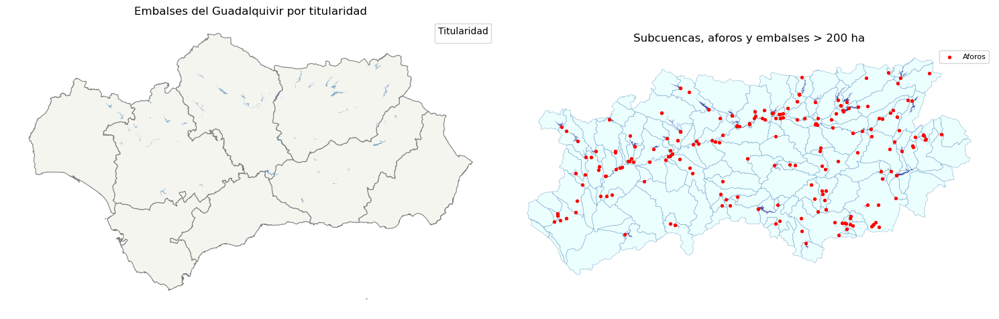

In [92]:
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Mapa 1: embalses por titularidad
provincias.plot(ax=axes[0], color='#f5f5f0', edgecolor='gray', linewidth=0.8)
colores = {'Estado': 'steelblue', 'Administración Autonómica': 'darkorange',
           'Municipal': 'forestgreen', 'Privada': 'red'}
for titular, grupo in embalses.groupby('titular'):
    grupo.plot(ax=axes[0], color=colores.get(titular, 'gray'), alpha=0.7, label=titular)
axes[0].legend(title='Titularidad', fontsize=8)
axes[0].set_title('Embalses del Guadalquivir por titularidad')
axes[0].set_axis_off()

# Mapa 2: cuencas + aforos + embalses grandes
cuencas.plot(ax=axes[1], color='lightcyan', edgecolor='steelblue', linewidth=0.4, alpha=0.6)
embalses[embalses['area_ha'] > 200].plot(ax=axes[1], color='navy', alpha=0.7, label='Embalses > 200 ha')
aforos.plot(ax=axes[1], color='red', markersize=8, zorder=5, label='Aforos')
axes[1].set_title('Subcuencas, aforos y embalses > 200 ha')
axes[1].legend(fontsize=8)
axes[1].set_axis_off()

plt.tight_layout()
plt.show()

In [69]:
# Mapa interactivo
embalses.explore(
    column='titular',
    cmap='Set1',
    tooltip=['nombre', 'titular', 'area_ha'],
    tiles='CartoDB positron',
    style_kwds={'opacity': 0.7, 'weight': 1}
)

---
## 3. Análisis raster-vector: estadísticas zonales

`rasterstats.zonal_stats()` calcula estadísticas de un raster para cada geometría vectorial.  
Aquí calculamos la **elevación media, máxima y el rango altitudinal** de cada subcuenca del Guadalquivir usando el MDT del DERA (resolución 100 m).

In [70]:
import rasterio
from rasterstats import zonal_stats

MDT = DATA + 'mdt_guadalquivir.tif'

with rasterio.open(MDT) as src:
    print(f'Resolución:  {src.res[0]:.0f} m')
    print(f'Dimensiones: {src.width} x {src.height} px')
    print(f'CRS:         EPSG:{src.crs.to_epsg()}')
    data = src.read(1, masked=True)
    print(f'Elevación:   {data.min():.0f} – {data.max():.0f} m')

Resolución:  100 m
Dimensiones: 4073 x 1991 px
CRS:         EPSG:25830
Elevación:   -150 – 3438 m


### 3.1 Estadísticas por subcuenca

In [71]:
stats = zonal_stats(
    cuencas,
    MDT,
    stats=['min', 'max', 'mean', 'std'],
    nodata=-9999
)

# Unir al GeoDataFrame
cuencas_stats = cuencas.copy()
stats_df = pd.DataFrame(stats).round(0)
cuencas_stats[['elev_min', 'elev_max', 'elev_media', 'elev_std']] = (
    stats_df[['min', 'max', 'mean', 'std']].values
)
cuencas_stats['rango_elev'] = cuencas_stats['elev_max'] - cuencas_stats['elev_min']

print('Subcuencas con mayor rango altitudinal:')
cuencas_stats.nlargest(10, 'rango_elev')[['nombre_sub', 'elev_min', 'elev_max', 'rango_elev', 'elev_media']]

Subcuencas con mayor rango altitudinal:


,nombre_sub,elev_min,elev_max,rango_elev,elev_media
146,ALTO GENIL,775.0,3438.0,2663.0,1949.0
73,GUADIANA MENOR,591.0,3137.0,2546.0,1233.0
149,ALTO GENIL,998.0,3357.0,2359.0,2043.0
147,ALTO GENIL,1293.0,3256.0,1963.0,2070.0
65,GUADALQUIVIR DEL GUADIANA MENOR AL GUADALBULLON,238.0,2147.0,1909.0,641.0
12,ALTO GENIL,422.0,2271.0,1849.0,788.0
7,GUADALBULLON,381.0,2154.0,1773.0,988.0
30,GUADALQUIVIR DEL GUADIANA MENOR AL GUADALBULLON,333.0,2061.0,1728.0,865.0
47,GUADIANA MENOR,655.0,2369.0,1714.0,975.0
130,GUADIANA MENOR,588.0,2261.0,1673.0,1167.0


### 3.2 Visualización

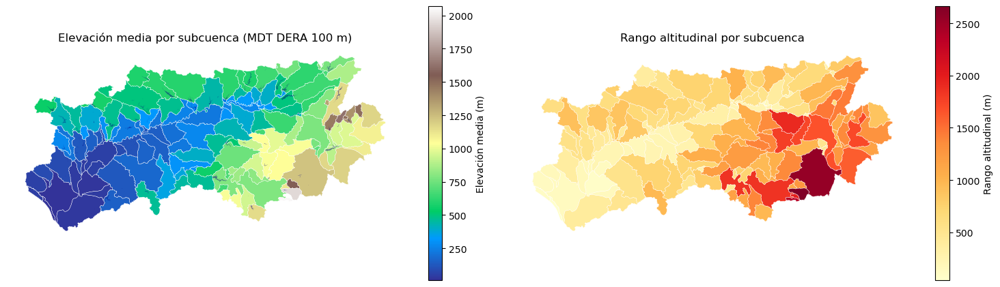

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

cuencas_stats.plot(
    ax=axes[0], column='elev_media', cmap='terrain', legend=True,
    edgecolor='white', linewidth=0.3,
    legend_kwds={'label': 'Elevación media (m)', 'shrink': 0.6}
)
embalses.plot(ax=axes[0], color='navy', alpha=0.5)
axes[0].set_title('Elevación media por subcuenca (MDT DERA 100 m)')
axes[0].set_axis_off()

cuencas_stats.plot(
    ax=axes[1], column='rango_elev', cmap='YlOrRd', legend=True,
    edgecolor='white', linewidth=0.3,
    legend_kwds={'label': 'Rango altitudinal (m)', 'shrink': 0.6}
)
axes[1].set_title('Rango altitudinal por subcuenca')
axes[1].set_axis_off()

plt.tight_layout()
plt.show()

In [73]:
cuencas_stats.explore(
    column='elev_media',
    cmap='terrain',
    tooltip=['nombre_sub', 'elev_min', 'elev_max', 'elev_media', 'rango_elev'],
    tiles='CartoDB positron',
    style_kwds={'opacity': 0.7, 'weight': 0.5}
)

---
## Resumen

| Librería | Rol | Cuándo usarla |
|----------|-----|---------------|
| **Fiona** | I/O vectorial sobre OGR | Control fino de schema, iteración feature a feature |
| **GeoPandas** | Análisis vectorial completo | El día a día: leer, operar, unir, visualizar |
| **rasterstats** | Estadísticas raster por zonas vectoriales | Cruzar MDT, NDVI, precipitación con polígonos |

**Flujo habitual:**
```python
gdf   = gpd.read_file('embalses.gpkg')           # Fiona por debajo
gdf   = gdf.to_crs(epsg=25830)                   # pyproj por debajo
gdf['area_ha'] = gdf.geometry.area / 10000       # Shapely por debajo
res   = gpd.sjoin(gdf, cuencas)                  # Shapely por debajo
stats = zonal_stats(cuencas, 'mdt.tif', ...)     # GDAL por debajo
res.to_file('salida.gpkg')                       # Fiona por debajo
```

---
*CHG — Curso de Python para el Análisis Espacial*